# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)
8. [Exercises](#exercises)

    a. [Pixel Wise Transformations](#pixelw)
    
    b. [Inverted Image](#invert)
    
    c. [Gamma Correction](#gamma)
    
    d. [Image Substraction](#substract)
9. [References](#references)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [3]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

## Loading Images <a class="anchor" id="loading"></a>

<class 'numpy.ndarray'>


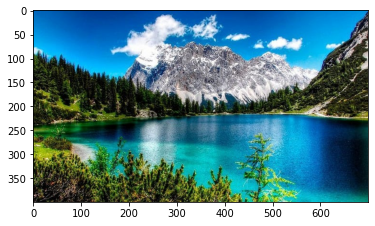

In [ ]:
img1 = mpimg.imread('data/image.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [ ]:
img1.shape

(400, 700, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

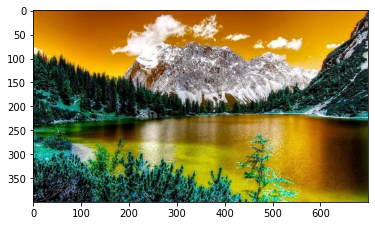

In [ ]:
img2 = cv2.imread('data/image.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB). 

Let's fix that

AxesImage(54,36;334.8x217.44)


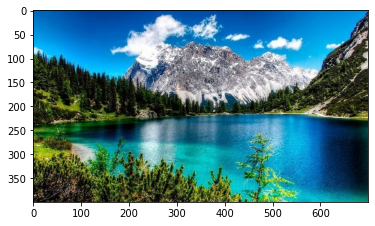

In [ ]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


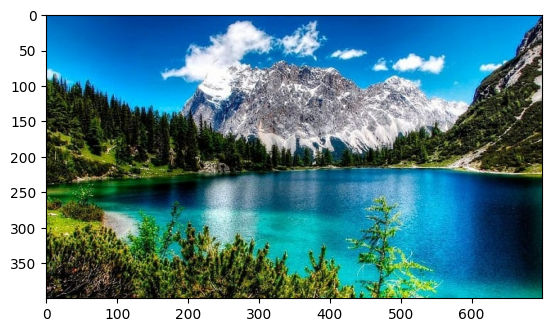

In [18]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('data/image.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [ ]:
img3 = np.array(img3)
img3.shape

(400, 700, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

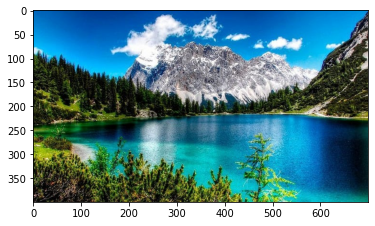

In [ ]:
# Save the image
np.save('data/img.npy', img3)

# Load the image
img3 = np.load('data/img.npy')

plt.imshow(img3)

## Resizing an Image <a class="anchor" id="resize"></a>
One of the most common manipulations of an image is to resize it. 

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 700 x 400
New size: 200 x 200


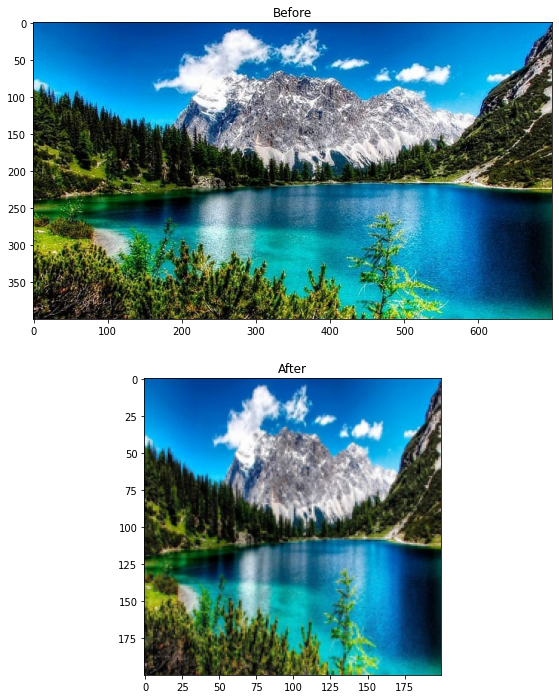

In [ ]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 700 x 400
Scaled size: 200 x 114
New size: 200 x 200


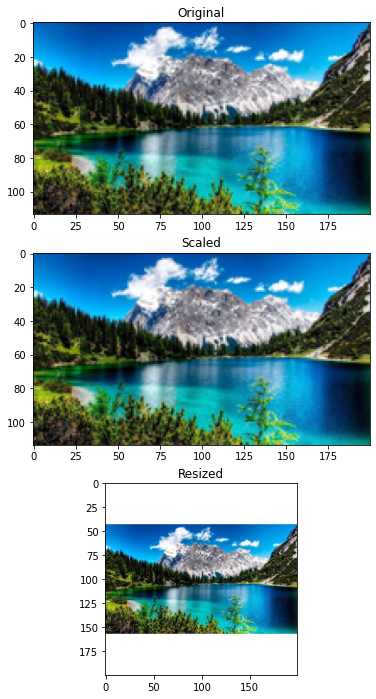

In [ ]:
# Get the image size
orig_height, orig_width = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size, Image.ANTIALIAS)
scaled_height, scaled_width = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a class="anchor" id="negative"></a>

In [ ]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

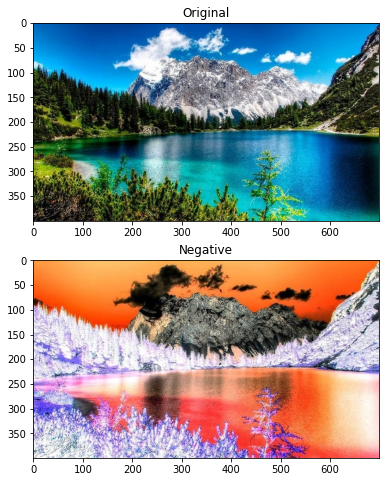

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a class="anchor" id="log"></a>

$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [ ]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
c = 255 / np.log(1 + np.max(orig_img))
log_img = c * (np.log(orig_img + 1))

# Specify the data type so that
# float value will be converted to int
log_img = np.array(log_img, dtype = np.uint8)

<ipython-input-26-df301d760c24>:6: RuntimeWarning: divide by zero encountered in log
  log_img = c * (np.log(orig_img + 1))


Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

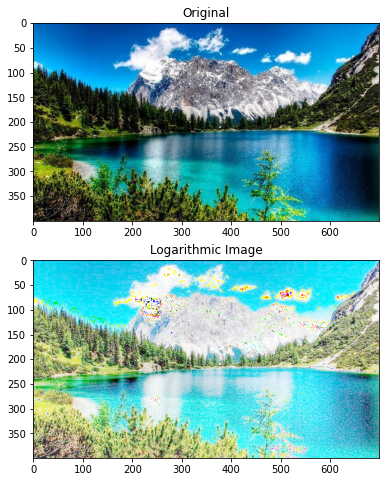

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a class="anchor" id="bin"></a>

Binarize pixels (set pixel values to 0 or 1) according to a threshold.

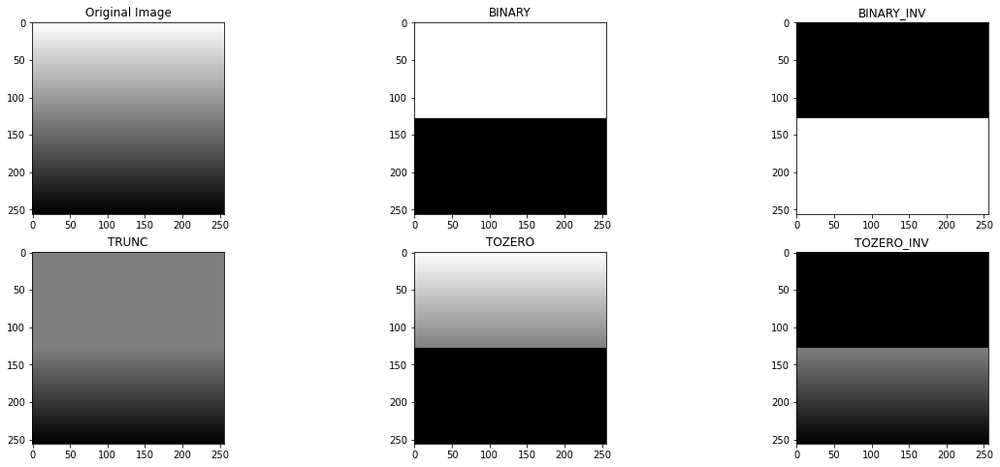

In [ ]:
orig_img = cv2.imread('data/linear_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)
 
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer  <a class="anchor" id="quant"></a>

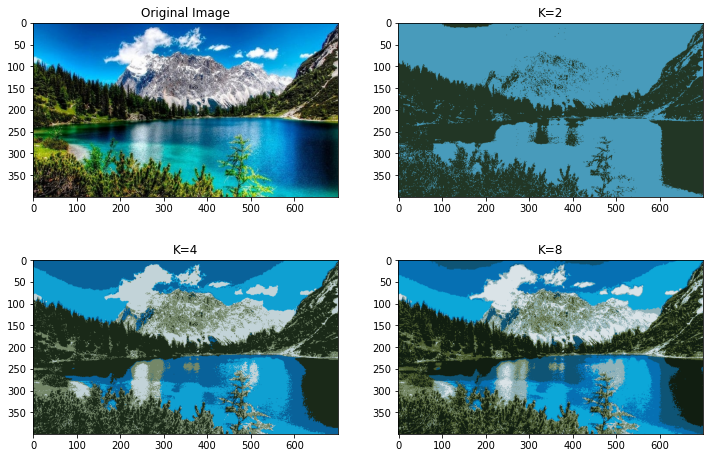

In [ ]:
orig_img = cv2.imread('data/image.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
   
   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

## EXCERCISES  <a class="anchor" id="exercises"></a>

In [29]:
# import libraries
from PIL import ImageEnhance
from scipy.ndimage import measurements,morphology
from skimage import io

# Function to plot images
def plot_images(orig_img, trans_img, img = None):
  plt.figure(figsize=([20, 20]))
  plt.subplot(121),plt.imshow(orig_img)
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(trans_img)
  plt.title('Transformed Image'), plt.xticks([]), plt.yticks([])

def plot_images_binarization(orig_img, trans_img):
  plt.figure(figsize=([30, 30]))
  plt.subplot(131),plt.imshow(orig_img)
  plt.title('Image1'), plt.xticks([]), plt.yticks([])
  plt.subplot(132),plt.imshow(trans_img)
  plt.title('Image2'), plt.xticks([]), plt.yticks([])
  plt.subplot(133),plt.imshow(trans_img, cmap='gray')
  plt.title('Grayscale Binarized Image'), plt.xticks([]), plt.yticks([])
  plt.show()


def plot_images_substracted(orig_img, trans_img, img = None):
  plt.figure(figsize=([40, 40]))
  plt.subplot(131),plt.imshow(orig_img)
  plt.title('Image1'), plt.xticks([]), plt.yticks([])
  plt.subplot(132),plt.imshow(trans_img)
  plt.title('Image2'), plt.xticks([]), plt.yticks([])
  plt.subplot(133),plt.imshow(img)
  plt.title('Substracte Image1-Image2'), plt.xticks([]), plt.yticks([])
  plt.show()



### 1.- PIXEL WISE TRANSFORMATIONS  <a class="anchor" id="pixelw"></a>

#### 1.1 Transformation 1 - Brightness & Contrast

This method consist in changing the bright and contrast of the images that can help to make more clear what we are visualzing; removing noise is also one of the possible benefits. This technique can be used for metheorological purpouses where the sunlight can be either present or not and might affect the quality of the image [1].

Brightness is a characteristic of an image that defines the intensity of a pixel relative to another. Contrast on the other hand is defined as the difference between maximum and minimum pixel intensity on the image.

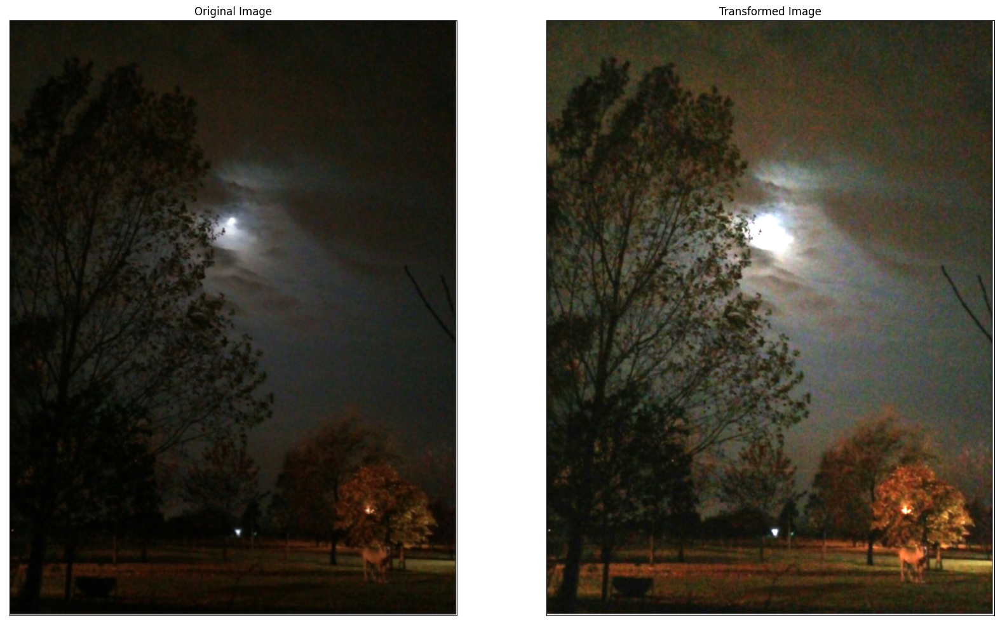

In [6]:
my_dark_img = io.imread('data/forest.jpeg')
my_trans_img = np.zeros(my_dark_img.shape, my_dark_img.dtype)
my_trans_img = cv2.convertScaleAbs(my_dark_img, alpha=2, beta=7)

plot_images(my_dark_img, my_trans_img)

Discussion:

As observed on our example image increasing the contrast and brightness of an image doesn’t necessarily make it a noise free image. We can see some new components of the images that might not be visible on the original, but we get an image that looks a little bit blurrier. We can observe that when we use this method, we need to be careful with the adjusted levels so for this reason we believe is a method that can be easy to learn and implement but not too optimal for professional use, specially not using it only by itself.

#### 1.2 Transformation 2 - Binarization

This technique consist on making into a two intensities based on a tresholds; it can be used in recovering documents like historical ones, making the text one and the background a single one [2]. In this technique Image pixels are separated into dual collection of pixels, in other words Image binarization is the process of taking a grayscale/color image and converting it into a two-color image, usually black and white.

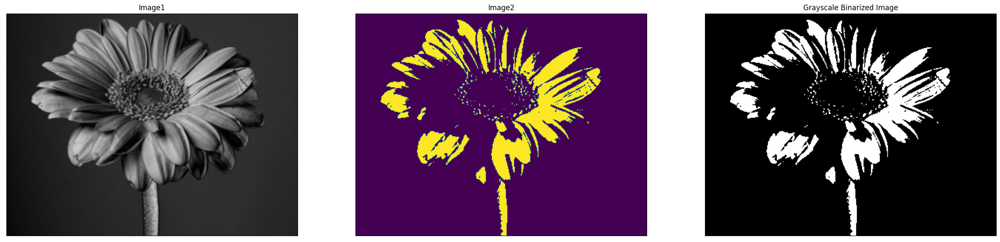

In [30]:
# load image and threshold to make sure it is binary
img_orig = Image.open('data/flower.png')
img_bin = np.array(Image.open('data/flower.png').convert('L'))
img_bin = (img_bin > 128) * 255

plot_images_binarization(img_orig, img_bin)

Discussion:
    
After the observation of the resulting images, we were left asking how this technique has impacted the analysis of historical documents. With the use of it, many historians could extract more context on old and damaged documents. We also believe that the use of this technique is helpful for decreasing the computation load on processors, from this technique the amount of memory and processor usage could allow the storage of bigger image datasets.

#### 1.3 Transformation 3 - Saturation

Through this technique we can get a better picture of the object of interest, through the increase or decrease of saturation we can obtain images with a better balance of color for our specific purposes. [3] If we are looking for more vibrant colors, we need to increase the saturation level, on the contrary if we want the colors to mutate and fade, we decrease the level.

It is difficult to get uniform saturation throughout an image so when performing any change on the image saturation we need to be careful in not oversaturate an image, this is due to the original saturation of the image not being the same throughout each pixel on it.

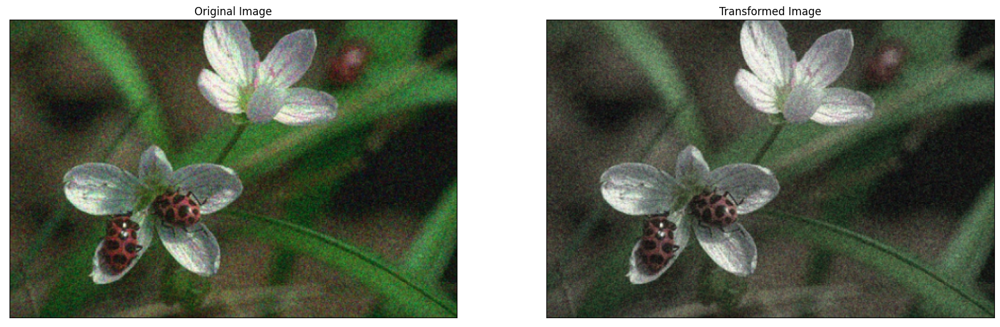

In [23]:
import PIL
img = PIL.Image.open('data/ladybug.png')
converter = PIL.ImageEnhance.Color(img)
img2 = converter.enhance(0.5)

plot_images(img, img2)

Discussion:

In the example we are using it , more attention can be put into the ladybugs rather than in the context. This can be used in object recognition, though the use of this technique we can program algorithms that are able to detect saturation changes on an image that correspond to certain objects. 

Saturation techniques could help on the photography industry as well to get more vibrant images and highlight the important features contained on the images being processed

### 2.- INVERT IMAGE (NEGATIVE)  <a class="anchor" id="invert"></a>

Invert images, or, to create "negatives" of these is to take the complements over the scale they have [1], a quite particular use case of this is to remove background when this is predominant; a classic example of this can be found with X-Rays or other type of Tomographies, like mammography [1]. If we want to change a black background for a white one for better understanding of an image this is the method to go [4].


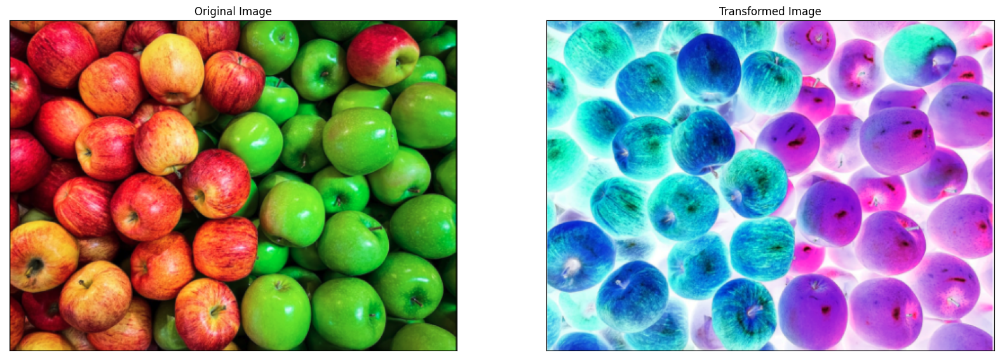

In [24]:
img = cv2.imread('data/apples.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB  )
img_inverted = cv2.bitwise_not(img)

plot_images(img, img_inverted)

Discussion:
    
In the example we show, we have a set of apples where the intersection between them make difficult to understand the number as those tend to blend with each other; we use the invert of this to instead of making the intersection something of confussion, rather something of contstranct, the exercise of counting the apples eases for the human eye with this technique.

### 3. GAMMA TRANSFORMATION <a class="anchor" id="gamma"></a>


Sometimes our images can be darker or brighter than what we want, for these caes we can use gamma transformations. This kind of tranformations are usefuls on MRIs [7]; can be also used to constrant what we are looking for or to remove the whashed out apparance where images are too bright [1].

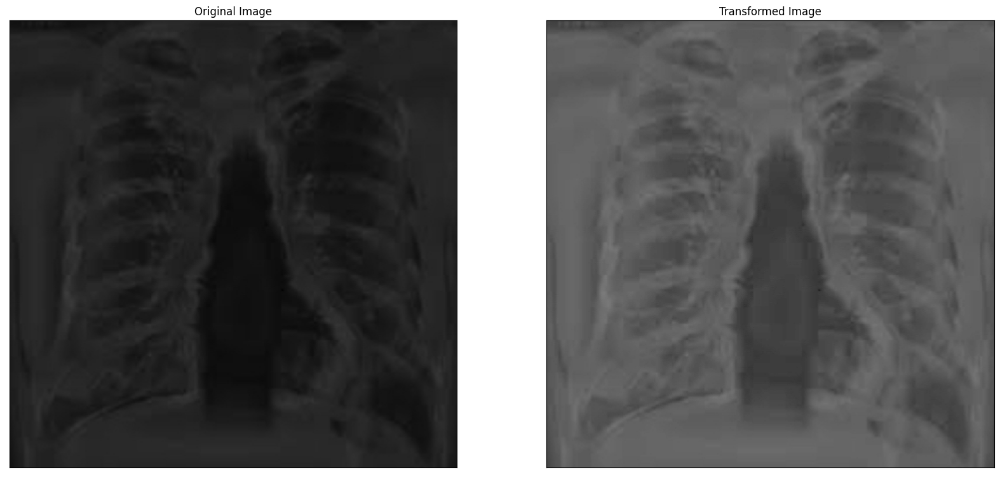

In [25]:
img_orig = cv2.imread('data/x-ray.jpg')
gamma = 2
invert_gamma = 1.0 / gamma
table = np.array([((i / 255.0) ** invert_gamma) * 255
  for i in np.arange(0, 256)]).astype("uint8")

img_gamma = cv2.LUT(img_orig, table)

plot_images(img_orig, img_gamma)

Discussion:
    
We discovered that gamma transformations it's a really needed technique in one of the most important fields in medicine as it's medical image processing (radiology). By using this technique images can be adjusted in response to the properties of human vision, in order to produce true color, in our example we see how a really dark image is transformed into a brighter one, helping us to detect more elements on it, This simple transformation is huge in life saving fields as it's medicine, so we need to be able to identify when and how to use it in a proper manner. 

### 4. IMAGE SUBSTRACTION  <a class="anchor" id="substract"></a>

Pixel or image substraction is commonly used for detecting differences between two images [1]. Image subtraction or pixel subtraction is a process whereby the digital numeric value of one pixel or whole image is subtracted from another image.

A clear application in health for this is by using mask image and live images for an angiography, by using and heancing the substraction. This method is also useful on forensics to detect document alteration [6].

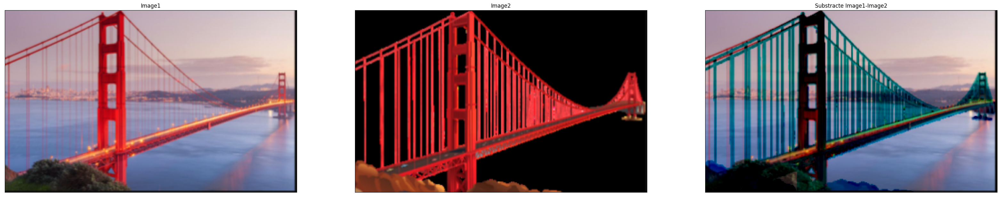

In [26]:
# reading the images
img_1 = cv2.imread('data/goldenGate.png')
img_2 = cv2.imread('data/onlyGoldenGate.png')
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

img_1 = cv2.resize(img_1, (800, 500), interpolation=cv2.INTER_AREA)
img_2 = cv2.resize(img_2, (800, 500), interpolation=cv2.INTER_AREA)
  
# subtract the images
img_sub = cv2.subtract(img_1, img_2)
plot_images_substracted(img_1, img_2, img_sub)



Discussion:

As we can see from the transformation above, this technique is a really interesting one. 

We think that this technique could potentiate many computer vision applications such as virtual and augmented reallity. It can also be used in medical imaging to detect the differences on healthy and unhealthy organisms.

The applications and importance of this technique we believe is huge and with a lot of potential for massification.


## References  <a class="anchor" id="references"></a>

[1] Wang, M., Zhou, S., Yang, Z., & Liu, Z. (2020). Error Analysis of Atmospheric Visibility Measurements Based on an Image Brightness Contrast Method. IEEE Access, Access, IEEE, 8, 48408–48415. https://0-doi-org.biblioteca-ils.tec.mx/10.1109/ACCESS.2020.2978941

[2] Dey, A., Das, N., & Nasipuri, M. (2022). Variational Augmentation for Enhancing Historical Document Image Binarization.

[3] Datang Zhou, Gang He, Kang Xu, & Chang Liu. (2023). A two‐stage hue‐preserving and saturation improvement color image enhancement algorithm without gamut problem. IET Image Processing, 17(1), 24–31. https://doi.org/10.1049/ipr2.12613

[4] Gonzalez, R. C., & Woods, R. E. (2018). Digital image processing (Fourth edition.). Pearson.

[5] Abhishek Yadav, & Poonam Yadav. (2009). Digital Image Processing: Vol. First edition. Laxmi Publications Pvt Ltd.

[6] Shivan, Pawan & Rebar, Rasheed & Marqas, Ridwan & Almufti, Saman. (2020). Image Processing Techniques for Identifying Impostor Documents Through Digital Forensic Examination. Technology Reports of Kansai University. 62. 1781-1794. 

[7] Wang, S., Jiang, Z., Yang, H., Li, X., & Yang, Z. (2022). MRI-Based Medical Image Recognition: Identification and Diagnosis of LDH. Computational Intelligence & Neuroscience, 1–9. https://doi.org/10.1155/2022/5207178